## Enhanced Fraud Detection System Model for E-Commerce and Banking Transactions Using Machine Learning
## Overview
This challenge focuses on building robust machine learning models for fraud detection in e-commerce and banking transactions. The project will involve analyzing, preprocessing, and integrating transaction data from both domains, engineering fraud-related features, and training multiple machine learning and deep learning models to detect fraudulent activity. The challenge also includes using geolocation and transaction pattern analysis to improve detection accuracy.

Participants will develop real-time fraud detection systems, ensuring efficiency and scalability in deployment. The project aims to deliver a fully operational fraud detection pipeline that includes model explainability, API deployment, and interactive dashboards.

## Objective
The primary objective of this challenge is to improve the detection of fraud cases in e-commerce and bank credit transactions by:

- Developing machine learning models to identify fraudulent patterns in both e-commerce and credit card transactions.
- Implementing geolocation analysis using IP address mappings and transaction pattern recognition.
- Enhancing model explainability through tools like SHAP and LIME for transparency in fraud detection.
- Deploying models in real-time using Flask, Docker, and developing APIs for serving fraud predictions.
- Creating an interactive dashboard with Dash to visualize fraud trends, fraud hotspots, and summary insights from transaction data.

## 1. Data Collection

### Import Necessary Library

In [1]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.metrics import classification_report
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, SimpleRNN, LSTM
import mlflow
import mlflow.sklearn
import mlflow.xgboost
import shap
import tqdm
import lime
import lime.lime_tabular
import os

import warnings

warnings.filterwarnings('ignore')

# Set plot style for better visuals
sns.set(style="whitegrid")

### Load Dataset

In [2]:
# Load the datasets
fraud_data = pd.read_csv('../data/fraud_cleaned_data.csv')
credit_data = pd.read_csv('../data/creditcard.csv')

In [3]:
fraud_data.shape, credit_data.shape

((151112, 20), (284807, 31))

In [4]:
fraud_data.columns, credit_data.columns

(Index(['Unnamed: 0', 'purchase_value', 'age', 'ip_address', 'class',
        'frequency', 'velocity', 'hour_of_day', 'day_of_week', 'time_diff',
        'signup_hour', 'signup_day_of_week', 'purchase_day_of_week',
        'source_Direct', 'source_SEO', 'browser_FireFox', 'browser_IE',
        'browser_Opera', 'browser_Safari', 'sex_M'],
       dtype='object'),
 Index(['Time', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10',
        'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20',
        'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'Amount',
        'Class'],
       dtype='object'))

## 2. Model Selection and Training

### 2.1 Separeting Dependand and Independant Variable

In [5]:
# For Credit Card Data
X_creditcard = credit_data.drop(columns=['Class'])  # independant Features
y_creditcard = credit_data['Class']                   # Target variable

# For Fraud Data
X_fraud = fraud_data.drop(columns=['class'])  # independant Features
y_fraud = fraud_data['class']      # Target variable

### 2.2 Train test split

In [6]:
# Train-test split for Credit Card Data
X_train_creditcard, X_test_creditcard, y_train_creditcard, y_test_creditcard = train_test_split(
    X_creditcard, y_creditcard, test_size=0.2, random_state=42, stratify=y_creditcard
)

# Train-test split for Fraud Data
X_train_fraud, X_test_fraud, y_train_fraud, y_test_fraud = train_test_split(
    X_fraud, y_fraud, test_size=0.2, random_state=42, stratify=y_fraud
)

In [7]:
print(np.unique(y_train_fraud, return_counts=True))
print(np.unique(y_train_creditcard, return_counts=True))

(array([0, 1], dtype=int64), array([109568,  11321], dtype=int64))
(array([0, 1], dtype=int64), array([227451,    394], dtype=int64))


### 2.3 Class Balancing Using SMOTE-Tomek Links

In [8]:
from imblearn.combine import SMOTETomek

# Apply SMOTE-Tomek Links for Credit Card Data
smote_tomek_creditcard = SMOTETomek(random_state=42)
X_train_creditcard_resampled, y_train_creditcard_resampled = smote_tomek_creditcard.fit_resample(X_train_creditcard, y_train_creditcard)

# Apply SMOTE-Tomek Links for Fraud Data
smote_tomek_fraud = SMOTETomek(random_state=42)
X_train_fraud_resampled, y_train_fraud_resampled = smote_tomek_fraud.fit_resample(X_train_fraud, y_train_fraud)


In [9]:
print(np.unique(y_train_fraud_resampled, return_counts=True))
print(np.unique(y_train_creditcard_resampled, return_counts=True))

(array([0, 1], dtype=int64), array([100250, 100250], dtype=int64))
(array([0, 1], dtype=int64), array([226818, 226818], dtype=int64))


## 2.4 Model Traning and Evaluation

### 2.4.1 Logistic Regression Model

#### Fraud Dataset

In [10]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_curve, auc, confusion_matrix, classification_report
log_reg_fraud = LogisticRegression(C=1, solver='liblinear')
log_reg_fraud.fit(X_train_fraud_resampled, y_train_fraud_resampled)
y_pred_log_fraud = log_reg_fraud.predict(X_test_fraud)
print(classification_report(y_test_fraud, y_pred_log_fraud))

# Evaluate the model
accuracy_fraud = accuracy_score(y_test_fraud, y_pred_log_fraud)
precision_fraud = precision_score(y_test_fraud, y_pred_log_fraud, average='weighted')
recall_fraud = recall_score(y_test_fraud, y_pred_log_fraud, average='weighted')
f1_fraud = f1_score(y_test_fraud, y_pred_log_fraud, average='weighted')

# Display Metrics for Fraud Data
print("\nFraud Data Metrics:")
print(f"Accuracy: {accuracy_fraud:.4f}")
print(f"Precision: {precision_fraud:.4f}")
print(f"Recall: {recall_fraud:.4f}")
print(f"F1 Score: {f1_fraud:.4f}")


              precision    recall  f1-score   support

           0       0.95      0.74      0.83     27393
           1       0.21      0.66      0.32      2830

    accuracy                           0.73     30223
   macro avg       0.58      0.70      0.57     30223
weighted avg       0.88      0.73      0.78     30223


Fraud Data Metrics:
Accuracy: 0.7310
Precision: 0.8848
Recall: 0.7310
F1 Score: 0.7842


#### CreditCard dataset

In [11]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_curve, auc, confusion_matrix, classification_report
log_reg_creditcard = LogisticRegression(C=1, solver='liblinear')
log_reg_creditcard.fit(X_train_creditcard_resampled, y_train_creditcard_resampled)
y_pred_log_creditcard = log_reg_creditcard.predict(X_test_creditcard)
print(classification_report(y_test_creditcard, y_pred_log_creditcard))

# Evaluate the model
accuracy_creditcard = accuracy_score(y_test_creditcard, y_pred_log_creditcard)
precision_creditcard = precision_score(y_test_creditcard, y_pred_log_creditcard, average='weighted')
recall_creditcard = recall_score(y_test_creditcard, y_pred_log_creditcard, average='weighted')
f1_creditcard = f1_score(y_test_creditcard, y_pred_log_creditcard, average='weighted')

# Display Metrics for Fraud Data
print("\ncreditcard Data Metrics:")
print(f"Accuracy: {accuracy_creditcard:.4f}")
print(f"Precision: {precision_creditcard:.4f}")
print(f"Recall: {recall_creditcard:.4f}")
print(f"F1 Score: {f1_creditcard:.4f}")


              precision    recall  f1-score   support

           0       1.00      0.98      0.99     56864
           1       0.07      0.91      0.14        98

    accuracy                           0.98     56962
   macro avg       0.54      0.94      0.56     56962
weighted avg       1.00      0.98      0.99     56962


creditcard Data Metrics:
Accuracy: 0.9802
Precision: 0.9982
Recall: 0.9802
F1 Score: 0.9885


In [12]:
X_train_fraud_resampled.shape, X_test_fraud.shape

((200500, 19), (30223, 19))

In [13]:
X_train_creditcard_resampled.shape, X_test_creditcard.shape

((453636, 30), (56962, 30))

#### Logistic Regressio SHAP Explainability

#### Fraud Data

  0%|          | 0/100 [00:00<?, ?it/s]

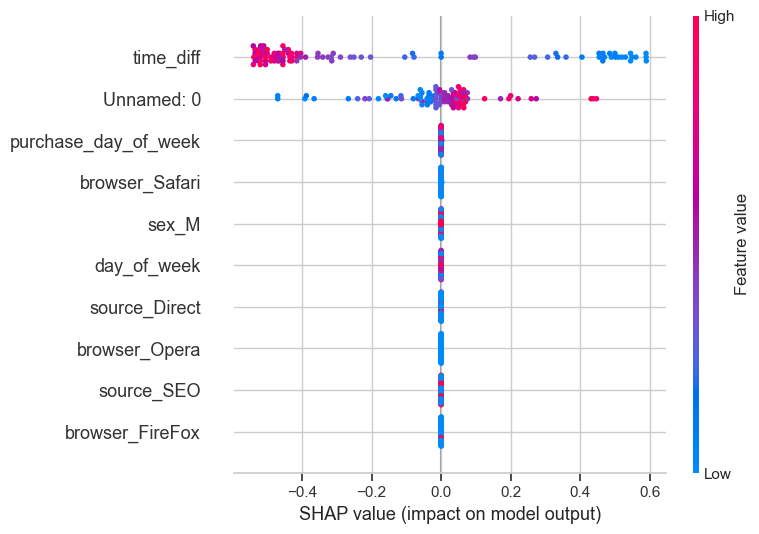

In [14]:
import shap

# Reduce the background data using shap.sample or shap.kmeans (with 100 samples)
background_sample = shap.sample(X_train_fraud_resampled, 100)  # Or use shap.kmeans(X_train_fraud_resampled, 100)

# SHAP explanation for fraud dataset using KernelExplainer with a reduced background
explainer1 = shap.KernelExplainer(log_reg_fraud.predict, background_sample)

# Calculate SHAP values using fewer test samples (limit if needed for speed)
shap_values1 = explainer1.shap_values(X_test_fraud[:100])  # Limit to the first 100 samples to speed up

# Now, summarize only the top 10 most important features
shap.summary_plot(shap_values1, X_test_fraud[:100], feature_names=X_fraud.columns, max_display=10)


#### Creditcard data

  0%|          | 0/100 [00:00<?, ?it/s]

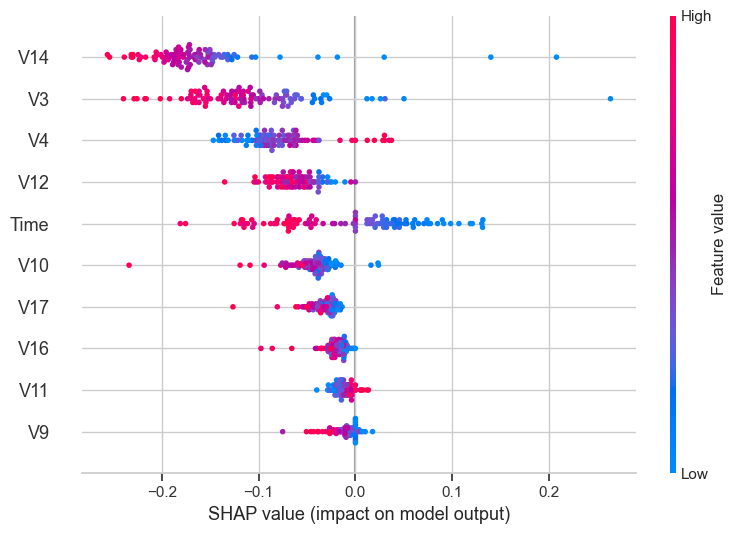

In [15]:
import shap

# Reduce the background data using shap.sample or shap.kmeans (with 100 samples)
background_sample = shap.sample(X_train_creditcard_resampled, 100)  # Or use shap.kmeans(X_train_fraud_resampled, 100)

# SHAP explanation for fraud dataset using KernelExplainer with a reduced background
explainer2 = shap.KernelExplainer(log_reg_creditcard.predict, background_sample)

# Calculate SHAP values using fewer test samples (limit if needed for speed)
shap_values2 = explainer2.shap_values(X_test_creditcard[:100])  # Limit to the first 100 samples to speed up

# Now, summarize only the top 10 most important features
shap.summary_plot(shap_values2, X_test_creditcard[:100], feature_names=X_creditcard.columns, max_display=10)


### LIME Explainability

#### Fraud Data

In [16]:
import lime
import lime.lime_tabular

# Create LIME explainer (use the credit card dataset for this example)
explainer_lr1 = lime.lime_tabular.LimeTabularExplainer(X_train_fraud_resampled.values, 
                                                      feature_names=X_fraud.columns, 
                                                      class_names=['Class 0', 'Class 1'], 
                                                      discretize_continuous=True)

# Pick an instance to explain (e.g., the first test instance)
i = 0  # You can change this index to any other test instance
instance_to_explain = X_test_fraud.iloc[i].values.reshape(1, -1)  # Reshape to match the model's input

# Explain the instance prediction using LIME for the logistic regression model
exp_lr1 = explainer_lr1.explain_instance(instance_to_explain.flatten(), log_reg_fraud.predict_proba)

# Display explanation for the Logistic Regression model
exp_lr1.show_in_notebook()


#### Creditcard data

In [17]:
import lime
import lime.lime_tabular

# Create LIME explainer (use the credit card dataset for this example)
explainer_lr2 = lime.lime_tabular.LimeTabularExplainer(X_train_creditcard_resampled.values, 
                                                      feature_names=X_creditcard.columns, 
                                                      class_names=['Class 0', 'Class 1'], 
                                                      discretize_continuous=True)

# Pick an instance to explain (e.g., the first test instance)
i = 0  # You can change this index to any other test instance
instance_to_explain = X_test_creditcard.iloc[i].values.reshape(1, -1)  # Reshape to match the model's input

# Explain the instance prediction using LIME for the logistic regression model
exp_lr2 = explainer_lr2.explain_instance(instance_to_explain.flatten(), log_reg_creditcard.predict_proba)

# Display explanation for the Logistic Regression model
exp_lr2.show_in_notebook()


## 2.4.2 Random Forest Model

### Model Traning and Evaluation

#### Fraud data

In [18]:
rf_clf_fraud = RandomForestClassifier(n_estimators=30, max_depth=3)
rf_clf_fraud.fit(X_train_fraud_resampled, y_train_fraud_resampled)
y_pred_rf_fraud = rf_clf_fraud.predict(X_test_fraud)
print(classification_report(y_test_fraud, y_pred_rf_fraud))

# Evaluate the model
accuracy_fraud = accuracy_score(y_test_fraud, y_pred_rf_fraud)
precision_fraud = precision_score(y_test_fraud, y_pred_rf_fraud, average='weighted')
recall_fraud = recall_score(y_test_fraud, y_pred_rf_fraud, average='weighted')
f1_fraud = f1_score(y_test_fraud, y_pred_rf_fraud, average='weighted')

# Display Metrics for Fraud Data
print("\n Randome Forest Fraud Data Metrics:")
print(f"Accuracy: {accuracy_fraud:.4f}")
print(f"Precision: {precision_fraud:.4f}")
print(f"Recall: {recall_fraud:.4f}")
print(f"F1 Score: {f1_fraud:.4f}")

              precision    recall  f1-score   support

           0       0.95      0.96      0.96     27393
           1       0.62      0.55      0.58      2830

    accuracy                           0.93     30223
   macro avg       0.79      0.76      0.77     30223
weighted avg       0.92      0.93      0.92     30223


 Randome Forest Fraud Data Metrics:
Accuracy: 0.9258
Precision: 0.9223
Recall: 0.9258
F1 Score: 0.9238


#### Creditcard Data

In [19]:
rf_clf_creditcard = RandomForestClassifier(n_estimators=30, max_depth=3)
rf_clf_creditcard.fit(X_train_creditcard_resampled, y_train_creditcard_resampled)
y_pred_rf_creditcard = rf_clf_creditcard.predict(X_test_creditcard)
print(classification_report(y_test_creditcard, y_pred_rf_creditcard))

# Evaluate the model
accuracy_creditcard = accuracy_score(y_test_creditcard, y_pred_rf_creditcard)
precision_creditcard = precision_score(y_test_creditcard, y_pred_rf_creditcard, average='weighted')
recall_creditcard = recall_score(y_test_creditcard, y_pred_rf_creditcard, average='weighted')
f1_creditcard = f1_score(y_test_creditcard, y_pred_rf_creditcard, average='weighted')

# Display Metrics for Fraud Data
print("\n Randome Forest Creditcard Data Metrics:")
print(f"Accuracy: {accuracy_creditcard:.4f}")
print(f"Precision: {precision_creditcard:.4f}")
print(f"Recall: {recall_creditcard:.4f}")
print(f"F1 Score: {f1_creditcard:.4f}")

              precision    recall  f1-score   support

           0       1.00      0.99      1.00     56864
           1       0.15      0.89      0.25        98

    accuracy                           0.99     56962
   macro avg       0.57      0.94      0.62     56962
weighted avg       1.00      0.99      0.99     56962


 Randome Forest Creditcard Data Metrics:
Accuracy: 0.9909
Precision: 0.9983
Recall: 0.9909
F1 Score: 0.9941


### SHAP Explainability

#### Fraud data

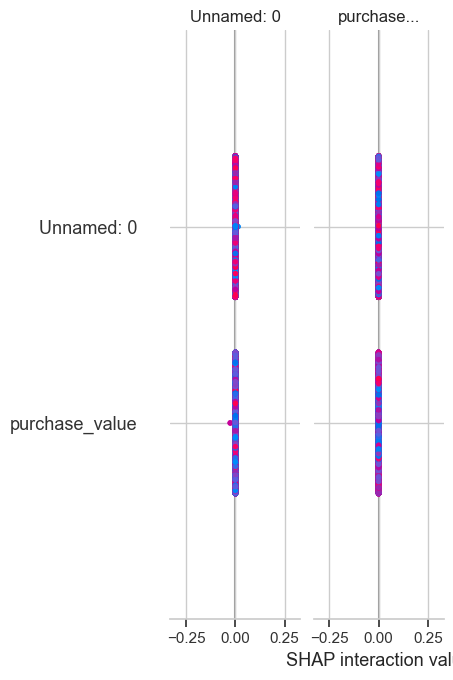

In [20]:
# SHAP explanation for Random Forest model
explainer_rf_fraud = shap.TreeExplainer(rf_clf_fraud)  # Use TreeExplainer for Random Forest
shap_values_fraud = explainer_rf_fraud.shap_values(X_test_fraud)  # Get SHAP values

# Plot summary plot for Random Forest model
shap.summary_plot(shap_values_fraud, X_test_fraud, feature_names=X_train_fraud_resampled.columns)

#### Creditcard Data

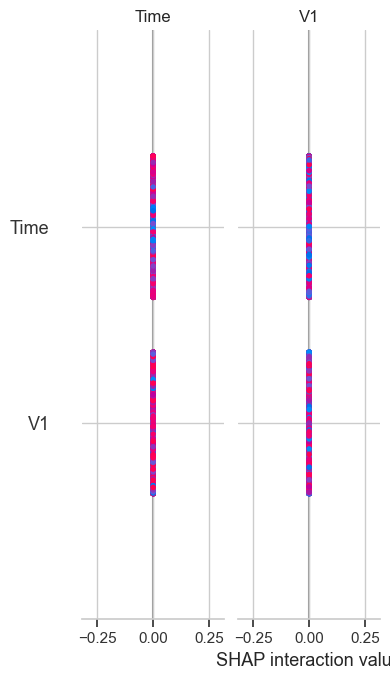

In [21]:
# SHAP explanation for Random Forest model
explainer_rf_creditcard = shap.TreeExplainer(rf_clf_creditcard)  # Use TreeExplainer for Random Forest
shap_values_creditcard = explainer_rf_fraud.shap_values(X_test_creditcard)  # Get SHAP values

# Plot summary plot for Random Forest model
shap.summary_plot(shap_values_creditcard, X_test_creditcard, feature_names=X_train_creditcard_resampled.columns)

### LIME Explainability

#### Fraud Data 

In [22]:
# Create LIME explainer for Random Forest
explainer_rf_fraud = lime.lime_tabular.LimeTabularExplainer(X_train_fraud_resampled.values, 
                                                      feature_names=X_train_fraud_resampled.columns, 
                                                      class_names=['Class 0', 'Class 1'], 
                                                      discretize_continuous=True)

# Pick an instance to explain (e.g., first test instance)
i = 0
exp_rf_fraud = explainer_rf_fraud.explain_instance(X_test_fraud.iloc[i], rf_clf_fraud.predict_proba)

# Display explanation for the Random Forest model
exp_rf_fraud.show_in_notebook()


#### Creditcard Data

In [23]:
# Create LIME explainer for Random Forest
explainer_rf_creditcard = lime.lime_tabular.LimeTabularExplainer(X_train_creditcard_resampled.values, 
                                                      feature_names=X_train_creditcard_resampled.columns, 
                                                      class_names=['Class 0', 'Class 1'], 
                                                      discretize_continuous=True)

# Pick an instance to explain (e.g., first test instance)
i = 0
exp_rf_creditcard = explainer_rf_creditcard.explain_instance(X_test_creditcard.iloc[i], rf_clf_creditcard.predict_proba)

# Display explanation for the Random Forest model
exp_rf_creditcard.show_in_notebook()


## 2.4.3 XGBoost Model

### Model Training and Evaluation

#### Fraud Data

In [24]:
xgb_clf_fraud = XGBClassifier(use_label_encoder=False, eval_metric='logloss')
xgb_clf_fraud.fit(X_train_fraud_resampled, y_train_fraud_resampled)
y_pred_xgb_fraud = xgb_clf_fraud.predict(X_test_fraud)
print(classification_report(y_test_fraud, y_pred_xgb_fraud))


              precision    recall  f1-score   support

           0       0.95      1.00      0.98     27393
           1       0.96      0.53      0.68      2830

    accuracy                           0.95     30223
   macro avg       0.96      0.76      0.83     30223
weighted avg       0.95      0.95      0.95     30223



In [25]:
# Evaluate the model
accuracy_fraud = accuracy_score(y_test_fraud, y_pred_xgb_fraud)
precision_fraud = precision_score(y_test_fraud, y_pred_xgb_fraud, average='weighted')
recall_fraud = recall_score(y_test_fraud, y_pred_xgb_fraud, average='weighted')
f1_fraud = f1_score(y_test_fraud, y_pred_xgb_fraud, average='weighted')

# Display Metrics for Fraud Data
print("\n XGBoost Fraud Data Metrics:")
print(f"Accuracy: {accuracy_fraud:.4f}")
print(f"Precision: {precision_fraud:.4f}")
print(f"Recall: {recall_fraud:.4f}")
print(f"F1 Score: {f1_fraud:.4f}")


 XGBoost Fraud Data Metrics:
Accuracy: 0.9538
Precision: 0.9541
Recall: 0.9538
F1 Score: 0.9477


#### Creditcard data

In [26]:
xgb_clf_creditcard = XGBClassifier(n_estimators=30, max_depth=3)
xgb_clf_creditcard.fit(X_train_creditcard_resampled, y_train_creditcard_resampled)
y_pred_xgb_clf_creditcard = rf_clf_creditcard.predict(X_test_creditcard)
print(classification_report(y_test_creditcard, y_pred_xgb_clf_creditcard))

# Evaluate the model
accuracy_creditcard = accuracy_score(y_test_creditcard, y_pred_xgb_clf_creditcard)
precision_creditcard = precision_score(y_test_creditcard, y_pred_xgb_clf_creditcard, average='weighted')
recall_creditcard = recall_score(y_test_creditcard, y_pred_xgb_clf_creditcard, average='weighted')
f1_creditcard = f1_score(y_test_creditcard, y_pred_xgb_clf_creditcard, average='weighted')

# Display Metrics for Creditcard Data
print("\n XGBoost Creditcard Data Metrics:")
print(f"Accuracy: {accuracy_creditcard:.4f}")
print(f"Precision: {precision_creditcard:.4f}")
print(f"Recall: {recall_creditcard:.4f}")
print(f"F1 Score: {f1_creditcard:.4f}")

              precision    recall  f1-score   support

           0       1.00      0.99      1.00     56864
           1       0.15      0.89      0.25        98

    accuracy                           0.99     56962
   macro avg       0.57      0.94      0.62     56962
weighted avg       1.00      0.99      0.99     56962


 XGBoost Creditcard Data Metrics:
Accuracy: 0.9909
Precision: 0.9983
Recall: 0.9909
F1 Score: 0.9941


### SHAP Explainability

#### Fraud data

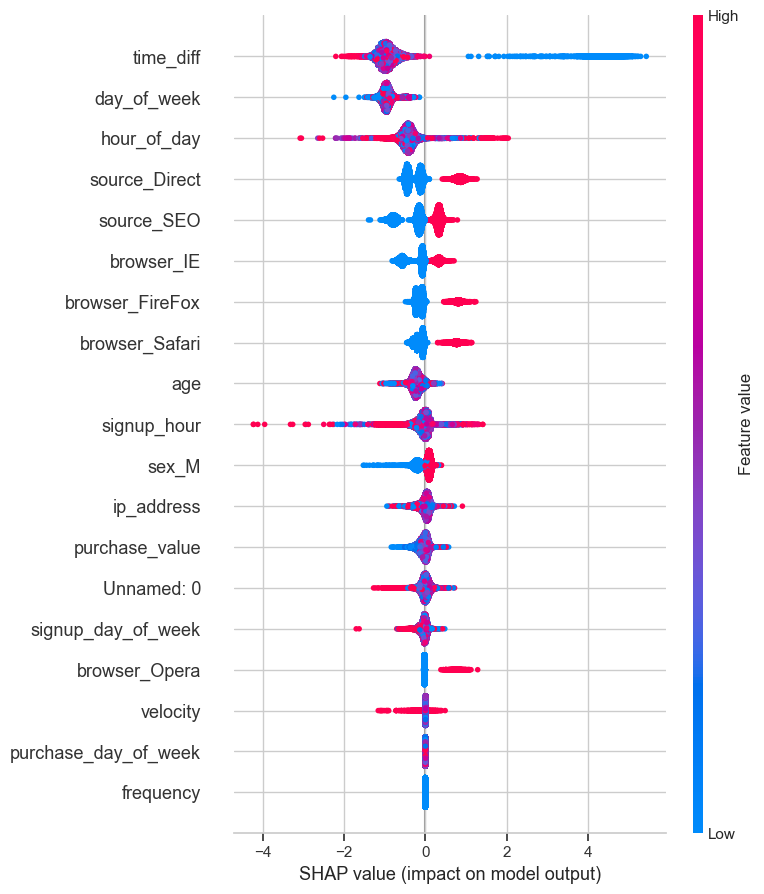

In [27]:
# SHAP explanation for XGBoost model
explainer_xgb_clf_fraud = shap.TreeExplainer(xgb_clf_fraud)  # Use TreeExplainer for XGBoost
shap_values_fraud = explainer_xgb_clf_fraud.shap_values(X_test_fraud)  # Get SHAP values

# Plot summary plot for XGBoost model
shap.summary_plot(shap_values_fraud, X_test_fraud, feature_names=X_train_fraud_resampled.columns)

#### Creditcard Data

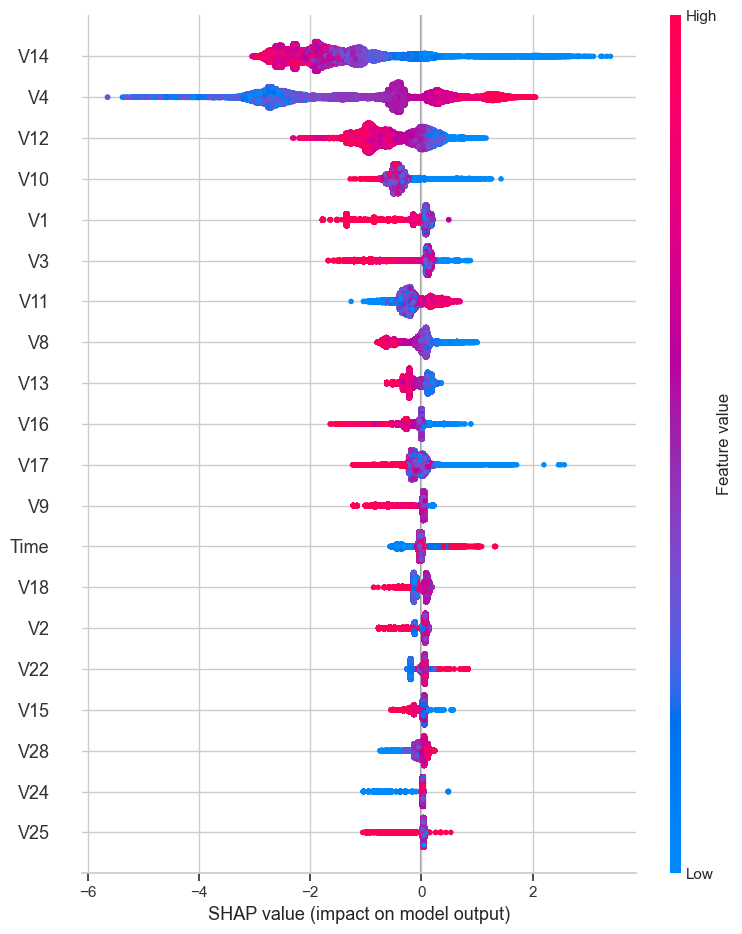

In [28]:
# SHAP explanation for XGBoost model
explainer_xgb_clf_creditcard = shap.TreeExplainer(xgb_clf_creditcard)  # Use TreeExplainer for XGBoost
shap_values_xgb_clf_creditcard = explainer_xgb_clf_creditcard.shap_values(X_test_creditcard)  # Get SHAP values

# Plot summary plot for XGbbost model
shap.summary_plot(shap_values_xgb_clf_creditcard, X_test_creditcard, feature_names=X_train_creditcard_resampled.columns)

### LIME Explainability

#### Fraud data

In [29]:
# Create LIME explainer for XGBoost
explainer_xgb_fraud = lime.lime_tabular.LimeTabularExplainer(X_train_fraud_resampled.values, 
                                                      feature_names=X_train_fraud_resampled.columns, 
                                                      class_names=['Class 0', 'Class 1'], 
                                                      discretize_continuous=True)

# Pick an instance to explain (e.g., first test instance)
i = 0
exp_xgb_fraud = explainer_xgb_fraud.explain_instance(X_test_fraud.iloc[i], xgb_clf_fraud.predict_proba)

# Display explanation for the XGboost model
exp_xgb_fraud.show_in_notebook()


#### creditcard data

In [30]:
# Create LIME explainer for XGBoost
explainer_xgb_creditcard = lime.lime_tabular.LimeTabularExplainer(X_train_creditcard_resampled.values, 
                                                      feature_names=X_train_creditcard_resampled.columns, 
                                                      class_names=['Class 0', 'Class 1'], 
                                                      discretize_continuous=True)

# Pick an instance to explain (e.g., first test instance)
i = 0
exp_xgb_creditcard = explainer_xgb_creditcard.explain_instance(X_test_creditcard.iloc[i], xgb_clf_creditcard.predict_proba)

# Display explanation for the XGBoost model
exp_xgb_creditcard.show_in_notebook()


## 2.4.4 Decision Tree

### Model Training and Evaluation

#### Fraud Data

In [31]:
dt_clf_fraud = DecisionTreeClassifier(max_depth=5)
dt_clf_fraud.fit(X_train_fraud_resampled, y_train_fraud_resampled)
y_pred_dt_fraud = dt_clf_fraud.predict(X_test_fraud)
print(classification_report(y_test_fraud, y_pred_dt_fraud))


              precision    recall  f1-score   support

           0       0.95      1.00      0.98     27393
           1       1.00      0.53      0.69      2830

    accuracy                           0.96     30223
   macro avg       0.98      0.76      0.83     30223
weighted avg       0.96      0.96      0.95     30223



In [32]:
# Evaluate the model
accuracy_fraud = accuracy_score(y_test_fraud, y_pred_dt_fraud)
precision_fraud = precision_score(y_test_fraud, y_pred_dt_fraud, average='weighted')
recall_fraud = recall_score(y_test_fraud, y_pred_dt_fraud, average='weighted')
f1_fraud = f1_score(y_test_fraud, y_pred_dt_fraud, average='weighted')

# Display Metrics for Fraud Data
print("\n Decision Tree Fraud Data Metrics:")
print(f"Accuracy: {accuracy_fraud:.4f}")
print(f"Precision: {precision_fraud:.4f}")
print(f"Recall: {recall_fraud:.4f}")
print(f"F1 Score: {f1_fraud:.4f}")


 Decision Tree Fraud Data Metrics:
Accuracy: 0.9556
Precision: 0.9576
Recall: 0.9556
F1 Score: 0.9493


#### Creditcard data

In [33]:
dt_clf_creditcard = DecisionTreeClassifier(max_depth=5)
dt_clf_creditcard.fit(X_train_creditcard_resampled, y_train_creditcard_resampled)
y_pred_dt_clf_creditcard = dt_clf_creditcard.predict(X_test_creditcard)
print(classification_report(y_test_creditcard, y_pred_dt_clf_creditcard))

# Evaluate the model
accuracy_creditcard = accuracy_score(y_test_creditcard, y_pred_dt_clf_creditcard)
precision_creditcard = precision_score(y_test_creditcard, y_pred_dt_clf_creditcard, average='weighted')
recall_creditcard = recall_score(y_test_creditcard, y_pred_dt_clf_creditcard, average='weighted')
f1_creditcard = f1_score(y_test_creditcard, y_pred_dt_clf_creditcard, average='weighted')

# Display Metrics for Creditcard Data
print("\n Decision Tree Creditcard Data Metrics:")
print(f"Accuracy: {accuracy_creditcard:.4f}")
print(f"Precision: {precision_creditcard:.4f}")
print(f"Recall: {recall_creditcard:.4f}")
print(f"F1 Score: {f1_creditcard:.4f}")

              precision    recall  f1-score   support

           0       1.00      0.98      0.99     56864
           1       0.06      0.89      0.11        98

    accuracy                           0.98     56962
   macro avg       0.53      0.93      0.55     56962
weighted avg       1.00      0.98      0.99     56962


 Decision Tree Creditcard Data Metrics:
Accuracy: 0.9756
Precision: 0.9982
Recall: 0.9756
F1 Score: 0.9861


### SHAP Explainability

#### Fraud data

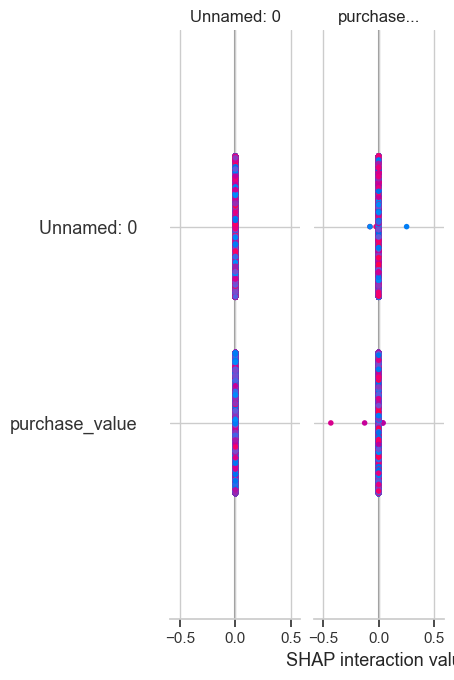

In [34]:
# SHAP explanation for Decion Tree model
explainer_dt_clf_fraud = shap.TreeExplainer(dt_clf_fraud)  # Use TreeExplainer for Decision Tree
shap_values_fraud = explainer_dt_clf_fraud.shap_values(X_test_fraud)  # Get SHAP values

# Plot summary plot for Decision Tree model
shap.summary_plot(shap_values_fraud, X_test_fraud, feature_names=X_train_fraud_resampled.columns)
plt.savefig('shap-plot/shap_summary_plot.png', bbox_inches='tight')  # Save the plot
plt.close()

#### Creditcard data

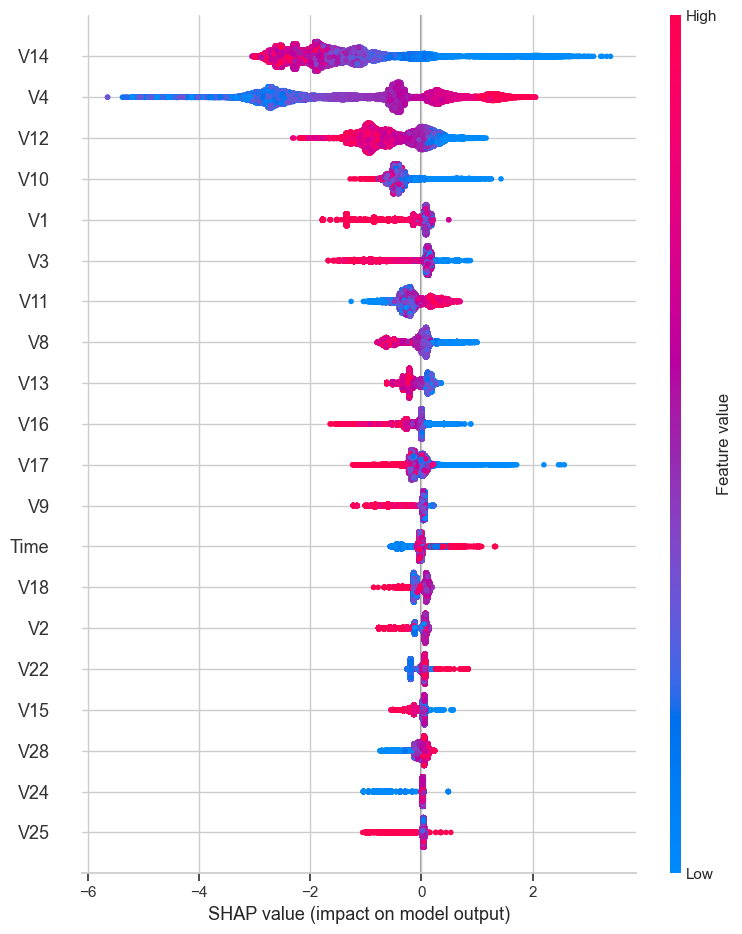

In [35]:
# SHAP explanation for Decion Tree model
explainer_dt_clf_creditcard = shap.TreeExplainer(dt_clf_creditcard)  # Use TreeExplainer for Decision Tree
shap_values_dt_clf_creditcard = explainer_xgb_clf_creditcard.shap_values(X_test_creditcard)  # Get SHAP values

# Plot summary plot for Decision model
shap.summary_plot(shap_values_dt_clf_creditcard, X_test_creditcard, feature_names=X_train_creditcard_resampled.columns)

### LIME Explainability

#### Fraud data

In [36]:
# Create LIME explainer for Decision Tree
explainer_dt_fraud = lime.lime_tabular.LimeTabularExplainer(X_train_fraud_resampled.values, 
                                                      feature_names=X_train_fraud_resampled.columns, 
                                                      class_names=['Class 0', 'Class 1'], 
                                                      discretize_continuous=True)

# Pick an instance to explain (e.g., first test instance)
i = 0
exp_dt_fraud = explainer_dt_fraud.explain_instance(X_test_fraud.iloc[i], dt_clf_fraud.predict_proba)

# Display explanation for the Decision Tree model
exp_dt_fraud.show_in_notebook()


#### CreditCard Dataset

In [37]:
# Create LIME explainer for Decion Tree
explainer_dt_creditcard = lime.lime_tabular.LimeTabularExplainer(X_train_creditcard_resampled.values, 
                                                      feature_names=X_train_creditcard_resampled.columns, 
                                                      class_names=['Class 0', 'Class 1'], 
                                                      discretize_continuous=True)

# Pick an instance to explain (e.g., first test instance)
i = 0
exp_dt_creditcard = explainer_dt_creditcard.explain_instance(X_test_creditcard.iloc[i], dt_clf_creditcard.predict_proba)

# Display explanation for the Decision Tree model
exp_dt_creditcard.show_in_notebook()
